## Instructions

This notebook contains three main segments of our framework

1. Identifying Latent Directions
2. Editing pointclouds
3. Semantic Localization Score

#### Run the notebook; entries which need to be customized are mentioned in *Notes*

In [1]:
import numpy as np
import sklearn
import json
from sklearn.manifold import TSNE
import argparse
import json
import logging
import random
from datetime import datetime
from importlib import import_module
from itertools import chain
from os.path import join, exists
import matplotlib.pyplot as plt
import torch
from torch.autograd import grad
import torch.backends.cudnn as cudnn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
from torch.utils.data import DataLoader
cudnn.benchmark = True
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
import os
from scipy import spatial
from os import listdir, makedirs
import re
from shutil import rmtree
from time import sleep
import torch.utils.data
#from torch.utils.data import DataLoader
import sys
import importlib
from tqdm import tqdm
#from torch.utils.data import DataLoader
from torch import nn
import torch.nn.functional as F
from sklearn import svm
from numpy import linalg as LA
import pandas as pd
from sklearn.decomposition import PCA

np.random.seed(44)

####  *Note: specify the object class below, under category*

In [2]:
category="chair"
types="parts"
num_of_parts=4
data_path=os.path.join("data",category+"_"+types+".npy")
object_parts=np.load(data_path)
object_full=np.load(os.path.join("data",category+"_objects.npy"))
  
# Data to be written
dictionary ={
    "category" : category,
    "type" : types,
}
  
# Serializing json 
json_object = json.dumps(dictionary, indent = 4)
  
with open("models/AAE/ckptselection.json", "w") as outfile:
    outfile.write(json_object)

In [3]:
from models.AAE.lspace_experiments import *

model_load_succesful


####    *Note: specify your root directory, under ROOT DIR*

In [5]:
def plot_many_objects(nrows, ncolumns, objs):
    
    fig = plt.figure(figsize=(6*ncolumns,4*nrows))
    
    for i in range(len(objs)):
        ax = fig.add_subplot(nrows, ncolumns, i+1, projection='3d')
        #ax = fig.gca(projection='3d')
        pt= np.asarray(objs[i])
        x = pt[0]
        y = pt[1]
        z = pt[2]
        if pt.shape[0]==4:
          #print('here')
          c= -1*pt[3]/max(pt[3])
        else:
          c = np.sqrt((x-9)**2 + (y+25)**2)# + (z-1.8)**2) # think later
        #print(c)
        ax.scatter(x, y, z, c=-c, cmap='Blues', s=30, marker='o', edgecolors='black', linewidths=0.015)
        max_range = np.array([x.max()-x.min(), y.max()-y.min(), z.max()-z.min()]).max()
        Xb = 0.5*max_range*np.mgrid[-1:2:2,-1:2:2,-1:2:2][0].flatten() + 0.5*(x.max()+x.min())
        Yb = 0.5*max_range*np.mgrid[-1:2:2,-1:2:2,-1:2:2][1].flatten() + 0.5*(y.max()+y.min())
        Zb = 0.5*max_range*np.mgrid[-1:2:2,-1:2:2,-1:2:2][2].flatten() + 0.5*(z.max()+z.min())
        # Comment or uncomment following both lines to test the fake bounding box:
        for xb, yb, zb in zip(Xb, Yb, Zb):
            ax.plot([xb], [yb], [zb], 'w')
        #ax.view_init(elev=20, azim=120)
        ax.set_axis_off()
    
    fig.tight_layout()
    plt.grid()
    plt.show()
    
# def plot_many_objects_400(nrows, ncolumns, objs):
    
#     fig = plt.figure(figsize=(6*ncolumns,4*nrows))
    
#     for i in range(len(objs)):
#         ax = fig.add_subplot(nrows, ncolumns, i+1, projection='3d')
#         #ax = fig.gca(projection='3d')
#         pt= np.asarray(objs[i])
#         x = pt[0]
#         y = pt[1]
#         z = pt[2]
#         if pt.shape[0]==4:
#           #print('here')
#           c= -1*pt[3]/max(pt[3])
#         else:
#           c = np.sqrt((x-9)**2 + (y+25)**2)# + (z-1.8)**2) # think later
#         #print(c)
#         ax.scatter(x, y, z, c=-c, cmap='Blues', s=60, marker='o', edgecolors='black', linewidths=0.015)
#         max_range = np.array([x.max()-x.min(), y.max()-y.min(), z.max()-z.min()]).max()
#         Xb = 0.5*max_range*np.mgrid[-1:2:2,-1:2:2,-1:2:2][0].flatten() + 0.5*(x.max()+x.min())
#         Yb = 0.5*max_range*np.mgrid[-1:2:2,-1:2:2,-1:2:2][1].flatten() + 0.5*(y.max()+y.min())
#         Zb = 0.5*max_range*np.mgrid[-1:2:2,-1:2:2,-1:2:2][2].flatten() + 0.5*(z.max()+z.min())
#         # Comment or uncomment following both lines to test the fake bounding box:
#         for xb, yb, zb in zip(Xb, Yb, Zb):
#             ax.plot([xb], [yb], [zb], 'w')
#         #ax.view_init(elev=20, azim=120)
#         ax.set_axis_off()
    
#     fig.tight_layout()
#     plt.grid()
#     plt.show()
    

def partsegpc(pc):
    ##pc of shape (2048, 3)
    chair=pc_normalize(pc)
    chair[:,[1,2]]=chair[:,[2,1]]
    parts=part_segmented_array(chair,classifier)
    return parts

class PointNet(nn.Module):
    def __init__(self, emb_dims=1024, output_channels=40):
        super(PointNet, self).__init__()
        self.emb_dims = emb_dims
        self.conv1 = nn.Conv1d(3, 64, kernel_size=1, bias=False)
        self.conv2 = nn.Conv1d(64, 64, kernel_size=1, bias=False)
        self.conv3 = nn.Conv1d(64, 64, kernel_size=1, bias=False)
        self.conv4 = nn.Conv1d(64, 128, kernel_size=1, bias=False)
        self.conv5 = nn.Conv1d(128, self.emb_dims, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm1d(64)
        self.bn2 = nn.BatchNorm1d(64)
        self.bn3 = nn.BatchNorm1d(64)
        self.bn4 = nn.BatchNorm1d(128)
        self.bn5 = nn.BatchNorm1d(self.emb_dims)
        self.linear1 = nn.Linear(self.emb_dims, 512, bias=False)
        self.bn6 = nn.BatchNorm1d(512)
        self.dp1 = nn.Dropout()
        self.linear2 = nn.Linear(512, output_channels)
        
        self.inv_head = nn.Sequential(
                            nn.Linear(self.emb_dims, 256),
                            nn.BatchNorm1d(256),
                            nn.ReLU(inplace=True),
                            )

    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)))
        x = F.relu(self.bn2(self.conv2(x)))
        x = F.relu(self.bn3(self.conv3(x)))
        x = F.relu(self.bn4(self.conv4(x)))
        x = F.relu(self.bn5(self.conv5(x)))
        x = F.adaptive_max_pool1d(x, 1).squeeze()
        feat = x
        x = F.relu(self.bn6(self.linear1(x)))
        x = self.dp1(x)
        x = self.linear2(x)
        
        inv_feat = self.inv_head(feat)
        
        return x, inv_feat, feat 
    
def con_latent_space(model_path, model_class, input_array):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    net = torch.load(model_path)
    model = model_class
    model.eval()
    model.load_state_dict(net)
    
    model = model.to(device)
    input_tensor = torch.from_numpy(input_array.astype('float32')).to(device)
    
    latent_vector = model(input_tensor)[2]
    return latent_vector

def part_resampling(pc):
    if len(pc) > 400:
        choice = np.random.choice(len(pc), 400, replace=True)
        point_set = pc[choice, :]
    elif len(pc) < 400:
        num_of_samples = 400 - len(pc)
        choice = np.random.choice(len(pc), num_of_samples, replace=True)
        additional_point_set = pc[choice, :]
        point_set = np.concatenate((pc, additional_point_set), axis=0)
    else:
        point_set = pc
    centroid = np.mean(point_set, axis=0)
    point_set = point_set - centroid
    return point_set

def segment_chair_parts(pc, i):
    seg = pc[:,3]
    obj = pc[:,0:3]
    num_of_parts = 4
    part_0 = []
    part_1 = []
    part_2 = []
    part_3 = []
    for point in range(0,2048):
        if seg[point] == 0:
            part_0.append(obj[point])
        elif seg[point] == 1:
            part_1.append(obj[point])
        elif seg[point] == 2:
            part_2.append(obj[point])
        else:
            part_3.append(obj[point])
    segmented_pc = []
    if len(part_0) > 0:
        resampled_part_0 = part_resampling(np.array(part_0))
        segmented_pc.append({'points': resampled_part_0, 'part': 0, 'obj': i})
    if len(part_1) > 0:
        resampled_part_1 = part_resampling(np.array(part_1))
        segmented_pc.append({'points': resampled_part_1, 'part': 1, 'obj': i})
    if len(part_2) > 0:
        resampled_part_2 = part_resampling(np.array(part_2))
        segmented_pc.append({'points': resampled_part_2, 'part': 2, 'obj': i})
    if len(part_3) > 0:
        resampled_part_3 = part_resampling(np.array(part_3))
        segmented_pc.append({'points': resampled_part_3, 'part': 3, 'obj': i})
    return segmented_pc

def to_categorical(y, num_classes):
    """ 1-hot encodes a tensor """
    new_y = torch.eye(num_classes)
    if (y.is_cuda):
        return new_y.cuda()
    return new_y  

model_path = "models/Part_Segment/Trained_Models/latent_con_model.pth"

ROOT_DIR = "/home/daia/Final_Repository/models"
sys.path.append(os.path.join(ROOT_DIR, 'Part_Segment'))
part_model_path=category+".pth"
num_part=num_of_parts
num_classes = 1
'''MODEL LOADING'''
from models.Part_Segment.pointnet_part_seg import *
MODEL = importlib.import_module("pointnet_part_seg")
classifier = MODEL.get_model(num_part, normal_channel=False).cuda()
checkpoint = torch.load(os.path.join("models/Part_Segment/Trained_Models",part_model_path))
classifier.load_state_dict(checkpoint['model_state_dict'])

seg_classes ={category: [0, 1, 2, 3]}
seg_label_to_cat = {}  
for cat in seg_classes.keys():
    for label in seg_classes[cat]:
        seg_label_to_cat[label] = cat

def part_segmented_array(chair,classifier):
    with torch.no_grad():
        shape_ious = {cat: [] for cat in seg_classes.keys()}
        seg_label_to_cat = {}  # {0:Airplane, 1:Airplane, ...49:Table}

        for cat in seg_classes.keys():
            for label in seg_classes[cat]:
                seg_label_to_cat[label] = cat

        classifier = classifier.eval()
        points= chair
        points=np.expand_dims(points, axis=0)
        points=torch.from_numpy(points)
        batchsize, num_point, _ = points.size()
        label=np.array([1.])
        label=np.expand_dims(label, axis=1)
        label=torch.from_numpy(label)
        #print(label.size())
        cur_batch_size, NUM_POINT, _ = points.size()
        points, label = points.float().cuda(), label.long().cuda()
        points = points.transpose(2, 1)

        vote_pool = torch.zeros(1, 2048, num_part).cuda()
        #print(label.size())
        for _ in range(3):
            seg_pred, _ = classifier(points, label)#to_categorical(label, num_classes))
            vote_pool += seg_pred

        seg_pred = vote_pool / 3
        cur_pred_val = seg_pred.cpu().data.numpy()
        cur_pred_val_logits = cur_pred_val
        cur_pred_val = np.zeros((cur_batch_size, NUM_POINT)).astype(np.int32)

        for i in range(cur_batch_size):
            #cat = seg_label_to_cat[target[i, 0]]
            logits = cur_pred_val_logits[i, :, :]
            cur_pred_val[i, :] = np.argmax(logits[:, seg_classes[cat]], 1) + seg_classes[cat][0]

    return(cur_pred_val)

def pc_normalize(pc):
    centroid = np.mean(pc, axis=0)
    pc = pc - centroid
    m = np.max(np.sqrt(np.sum(pc ** 2, axis=1)))
    pc = pc / m
    return pc

def get_segmented_parts(chair):
    segmented_pcs = []
    chair=pc_normalize(chair)
    chair[:,[1,2]]=chair[:,[2,1]]
    parts=part_segmented_array(chair,classifier)
    chair[:,[1,2]]=chair[:,[2,1]]
    parts=np.expand_dims(parts[0], axis=1)
    chair_final=np.append(chair,parts,axis=1)
    #print(np.shape(chair_final))
    try:
        segmented_pc = segment_chair_parts(chair_final, 0)
        for each in segmented_pc:
            segmented_pcs.append(each)
    except:
        pass
    
    if len(segmented_pcs) > 0:
        available_parts = []
        part_pc_array = []
        for i in range(len(segmented_pcs)):
            part_pc_array.append(segmented_pcs[i]['points'].T)
            available_parts.append(segmented_pcs[i]['part'])
        part_pc_array = np.array(part_pc_array)
        
        full_part_pc_array=[]
        item=0
        for each in range(0,4):
            if each not in available_parts:
                full_part_pc_array.append(np.full((3,400),np.nan))
                pass
            else:
                full_part_pc_array.append(part_pc_array[item])
                item+=1
                
        return (full_part_pc_array)
    else:
        print('error in part resampling')
        return False

def get_latent_vector(chair):
    part_segmented=[]
    manual=0
    segmented_pcs = []
    chair=pc_normalize(chair)
    chair[:,[1,2]]=chair[:,[2,1]]
    parts=part_segmented_array(chair,classifier)
   # print(np.shape(chair))
    chair[:,[1,2]]=chair[:,[2,1]]
    parts=np.expand_dims(parts[0], axis=1)
    chair_final=np.append(chair,parts,axis=1)
    #print(np.shape(chair_final),"chair_final_1")
    #chair_final=chair_final[0]
    #chair_final=np.expand_dims(chair_final,axis=1)
    part_segmented.append(chair_final)
    #print(np.shape(chair_final),"chair_final")
    try:
        segmented_pc = segment_chair_parts(chair_final, 0)
        for each in segmented_pc:
          segmented_pcs.append(each)
    except:
        pass
    
    if len(segmented_pcs) > 0:
        available_parts = []
        part_pc_array = []
        for i in range(len(segmented_pcs)):
            part_pc_array.append(segmented_pcs[i]['points'].T)
            available_parts.append(segmented_pcs[i]['part'])
        part_pc_array = np.array(part_pc_array)
#         part_pc_array= np.expand_dims(part_pc_array, axis=0)
#         print(np.shape(part_pc_array))
        if (np.shape(part_pc_array)==(1, 3, 400)):
            manual=1
            part_pc_array=np.append(part_pc_array,part_pc_array,axis=0)
        #print(np.shape(part_pc_array))
        latent_vector = con_latent_space(model_path, PointNet(), part_pc_array)
#         print(np.shape(latent_vector))
        if manual==1:
            latent_vector=latent_vector[0]
            latent_vector = latent_vector.unsqueeze(0)
#         print(np.shape(latent_vector))
        full_latent_vector = []
        item=0
        for each in range(0,4):
            if each not in available_parts:
                full_latent_vector.append(np.full(1024,-10))
                pass
            else:
                full_latent_vector.append(latent_vector[item].cpu().detach().numpy())
                item+=1
        return (np.array(full_latent_vector))
    else:
        print('error in part resampling')
        return False
    
# def get_latent_vector_part(chair):
#     segmented_pcs = []
#     chair_final= chair["points"] 
#     print(np.shape(chair_final))
#     try:
#         segmented_pc = segment_chair_parts(chair_final, 0)
#         for each in segmented_pc:
#             segmented_pcs.append(each)
#     except:
#         pass
    
#     print(np.shape(segmented_pcs))
#     if len(segmented_pcs) > 0:
#         available_parts = []
#         part_pc_array = []
#         for i in range(len(segmented_pcs)):
#             part_pc_array.append(segmented_pcs[i]['points'].T)
#             available_parts.append(segmented_pcs[i]['part'])
#         part_pc_array = np.array(part_pc_array)
#         print(np.shape(part_pc_array),":")
#         latent_vector = con_latent_space(model_path, PointNet(), part_pc_array)
#         full_latent_vector = []
#         for each in range(0,4):
#             if each not in available_parts:
#                 full_latent_vector.append(np.full(1024,-10))
#                 pass
#             else:
#                 full_latent_vector.append(latent_vector[each].cpu().detach().numpy())
#         return (np.array(full_latent_vector))
#     else:
#         print('error in part resampling')
#         return False
    
def get_feature_dist(obj1, obj2):
    l1= get_latent_vector(obj1)
    l2= get_latent_vector(obj2)
    result=[]
    for i in range(4):
        if False not in list(l1[i]==np.ones(1024)*-10) and False not in list(l2[i]==np.ones(1024)*-10):
            #print('1')
            result.append(0)
        elif False not in list(l1[i]==np.ones(1024)*-10):
            #print('2')
            result.append(10)
            #result.append(spatial.distance.cosine(np.zeros(1024), l2[i]))
        elif False not in list(l2[i]==np.ones(1024)*-10):
            #print('3')
            result.append(10)
            #result.append(spatial.distance.cosine(l1[i], np.zeros(1024)))
        else:
            #print('4')
            result.append(spatial.distance.cosine(l1[i], l2[i]))
    return result, l1, l2

## Calculating distance from a point to a hyperplane
def dist_hyperplane(coef, intercept, point):
    dist= (np.matmul(coef,point.T)[0]+intercept)/LA.norm(coef)    
    return dist

In [6]:
# def cluster_part_cont_ls(part_id, n_clusters):
    
#     clustering = AgglomerativeClustering(n_clusters=n_clusters).fit(tsne_parts[part_id])
#     labels=clustering.labels_
# #     clustering = AgglomerativeClustering(n_clusters=n_clusters).fit(frag_latent[:,part_id,:])
# #     labels=clustering.labels_
    
#     return labels

# def cluster_part_cont_ls2(part_id, n_clusters):
    
# #     clustering = AgglomerativeClustering(n_clusters=n_clusters).fit(tsne_parts[part_id])
# #     labels=clustering.labels_
#     clustering = AgglomerativeClustering(n_clusters=n_clusters).fit(frag_latent[:,part_id,:])
#     labels=clustering.labels_
    
#     return labels

def segment_recons_ls(n_clusters, labels):
    coefs=[] 
    intercepts=[]
    
    print('Fitting SVMs')
    for i in range(n_clusters):
        clf = svm.SVC(kernel='linear')
        clf = clf.fit(normalized_latent, labels==i)
        intercept, coef= clf.intercept_, clf.coef_
        intercepts.append(intercept)
        coefs.append(coef)

    return coefs, intercepts

def cluster_part_cont_ls4(part_id, n_clusters):
    clustering = AgglomerativeClustering(n_clusters=n_clusters).fit(reduced_frag_latent[:,part_id,:])
    labels=clustering.labels_
    return labels


In [7]:
def chamfer_dist(obj1, obj2):

    x=torch.from_numpy(np.asarray([obj1.T]))
    y=torch.from_numpy(np.asarray([obj2.T]))

    bs,num_points_x, points_dim = x.size()
    _,num_points_y, _ = y.size()

    #print(bs, num_points_x, points_dim)
    xx = torch.bmm(x, x.transpose(2, 1))
    yy = torch.bmm(y, y.transpose(2, 1))
    zz = torch.bmm(x, y.transpose(2, 1))
    diag_ind_x = torch.arange(0, num_points_x)
    diag_ind_y = torch.arange(0, num_points_y)

    if x.get_device() != -1:
        diag_ind_x = diag_ind_x.cuda(x.get_device())
        diag_ind_y = diag_ind_y.cuda(x.get_device())

    rx = xx[:, diag_ind_x, diag_ind_x].unsqueeze(1).expand_as(zz.transpose(2, 1))
    ry = yy[:, diag_ind_y, diag_ind_y].unsqueeze(1).expand_as(zz)
    P = (rx.transpose(2, 1) + ry - 2 * zz)

    mins1, _ = torch.min(P, 1)
    loss_1 = torch.mean(mins1)
    mins2, _ = torch.min(P, 2)
    loss_2 = torch.mean(mins2)
    #print(mins1.shape)
    
    #print(loss_1, loss_2)
    return [loss_1.cpu().numpy(), loss_2.cpu().numpy()]

def part_change_score2(obj1,obj2):

    parts1= partsegpc(obj1.T)[0]
    parts2= partsegpc(obj2.T)[0]
    
    scores=[]
    
    for i in range(4):
        token=False
        x=torch.from_numpy(np.asarray([obj1.T[parts1==i]]))
        y=torch.from_numpy(np.asarray([obj2.T[parts2==i]]))

        bs,num_points_x, points_dim = x.size()
        _,num_points_y, _ = y.size()
        #print(num_points_x, num_points_y)
        
        if num_points_x==0 and num_points_y==0:
            #print('here')
            scores.append([0, 0])
            continue
        else:
            if num_points_x==0: 
                #print('a')
                x=torch.from_numpy(np.asarray([obj1.T]))
                token=True
            if num_points_y==0:
                #print('b')
                y=torch.from_numpy(np.asarray([obj2.T]))
                token=True
                
            bs,num_points_x, points_dim = x.size()
            _,num_points_y, _ = y.size()
            #print(num_points_x, num_points_y)
            xx = torch.bmm(x, x.transpose(2, 1))
            yy = torch.bmm(y, y.transpose(2, 1))
            zz = torch.bmm(x, y.transpose(2, 1))
            diag_ind_x = torch.arange(0, num_points_x)
            diag_ind_y = torch.arange(0, num_points_y)

            if x.get_device() != -1:
                diag_ind_x = diag_ind_x.cuda(x.get_device())
                diag_ind_y = diag_ind_y.cuda(x.get_device())
                
            rx = xx[:, diag_ind_x, diag_ind_x].unsqueeze(1).expand_as(zz.transpose(2, 1))
            ry = yy[:, diag_ind_y, diag_ind_y].unsqueeze(1).expand_as(zz)
            P = (rx.transpose(2, 1) + ry - 2 * zz)
            #print(P)
            mins1, _ = torch.min(P, 1)
            loss_1 = torch.mean(mins1)
            mins2, _ = torch.min(P, 2)
            loss_2 = torch.mean(mins2)

            if token:
                a,b= loss_1.cpu().numpy(), loss_2.cpu().numpy()
                scores.append([min(a,b),min(a,b)])
            else:
                scores.append([loss_1.cpu().numpy(), loss_2.cpu().numpy()])
        
    return scores, parts1, parts2


In [8]:
# make fragmented latent space
frag_latent=[]
aux=np.ones((1,400))

for i in object_parts:
    frame=[]
    for j in i:
        code=encode(j.T)
        if np.isnan(code).any():
            frame.append(aux)
        else:
            frame.append(code)
    frag_latent.append(frame)

frag_latent=np.squeeze(np.array(frag_latent))
print(np.shape(frag_latent))

num_objs=len(frag_latent)

(6778, 4, 400)


In [9]:
reduced_frag_latent=[]
for i in range(4):
    pca = PCA(n_components=50)
    tofit=[]
    
    for j in range(num_objs):
        if np.all(frag_latent[j,i,:] == np.ones(400)*-10):
            continue
        else:
            tofit.append(frag_latent[j,i,:])
            
    tofit= np.asarray(tofit)
            
    pca.fit(tofit.T)
    fitted= pca.components_.T
    
    fitted_all=[]
    counter=0
    for j in range(num_objs):
        if np.all(frag_latent[j,i,:] == np.ones(400)*-10):
            fitted_all.append(np.ones(50)*-1)
        else:
            fitted_all.append(fitted[counter])
            counter+=1
            
    reduced_frag_latent.append(fitted_all)
    
reduced_frag_latent= np.asarray(reduced_frag_latent)
reduced_frag_latent=np.transpose(reduced_frag_latent, axes=[1, 0, 2])

reduced_frag_latent.shape

(6778, 4, 50)

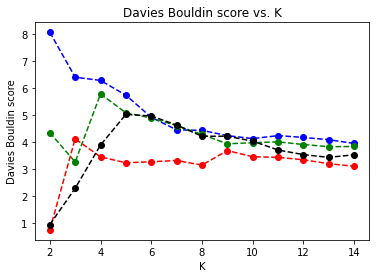

In [10]:
# Davies Bouldin score for K means


from sklearn.metrics import davies_bouldin_score
def get_kmeans_score(cluster_df, center):
#     kmeans = KMeans(n_clusters=center)
    kmeans= AgglomerativeClustering(n_clusters=center)
    model = kmeans.fit_predict(cluster_df)
    score = davies_bouldin_score(cluster_df, model)
    return score

scores = []
centers = list(range(2,15))

a=[]
for i in range(num_objs):
    a.append(np.all(reduced_frag_latent[i,0,:]!=np.ones(50)*-1))
    
for center in centers:
    scores.append(get_kmeans_score(reduced_frag_latent[:,0,:][a], center))
    
plt.plot(centers, scores, linestyle='--', marker='o', color='b');
plt.xlabel('K');
plt.ylabel('Davies Bouldin score');
plt.title('Davies Bouldin score vs. K');

scores = []
centers = list(range(2,15))

a=[]
for i in range(num_objs):
    a.append(np.all(reduced_frag_latent[i,1,:]!=np.ones(50)*-1))
    
for center in centers:
    scores.append(get_kmeans_score(reduced_frag_latent[:,1,:][a], center))
    
plt.plot(centers, scores, linestyle='--', marker='o', color='g');
plt.xlabel('K');
plt.ylabel('Davies Bouldin score');
plt.title('Davies Bouldin score vs. K');

scores = []
centers = list(range(2,15))

a=[]
for i in range(num_objs):
    a.append(np.all(reduced_frag_latent[i,2,:]!=np.ones(50)*-1))
    
for center in centers:
    scores.append(get_kmeans_score(reduced_frag_latent[:,2,:][a], center))
    
plt.plot(centers, scores, linestyle='--', marker='o', color='r');
plt.xlabel('K');
plt.ylabel('Davies Bouldin score');
plt.title('Davies Bouldin score vs. K');

scores = []
centers = list(range(2,15))

a=[]
for i in range(num_objs):
    a.append(np.all(reduced_frag_latent[i,3,:]!=np.ones(50)*-1))
    
for center in centers:
    scores.append(get_kmeans_score(reduced_frag_latent[:,3,:][a], center))
    
plt.plot(centers, scores, linestyle='--', marker='o', color='k');
plt.xlabel('K');
plt.ylabel('Davies Bouldin score');
plt.title('Davies Bouldin score vs. K');

#### Note: select the number of clusters based on the dips in curve +1 (for instances when the part is unavailable)
#####    4,4,6,6

Feature number= 0
2011
1026, 2754, 4944, 1443, 2252, 1199, 4445, 1821, 4355, 2524, 6556, 4136, 6558, 118, 2335, 1346, 878, 6279, 4917, 719, 


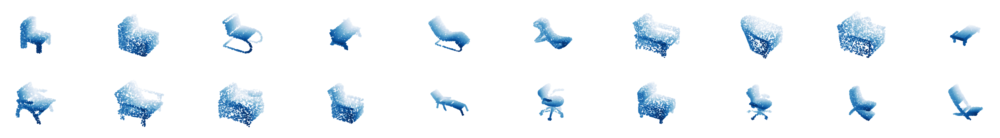

***********************************
3408
3053, 1324, 5971, 5063, 3573, 4705, 4908, 502, 3359, 3, 5953, 2742, 1344, 3650, 1128, 6413, 4423, 2948, 6040, 3037, 


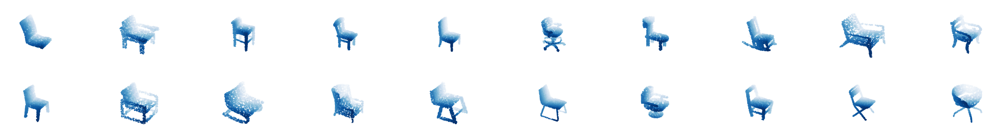

***********************************
248
6749, 1760, 3059, 3898, 4217, 3810, 3634, 1982, 3336, 1756, 4453, 601, 4403, 4911, 3899, 5768, 6361, 2302, 1596, 4669, 


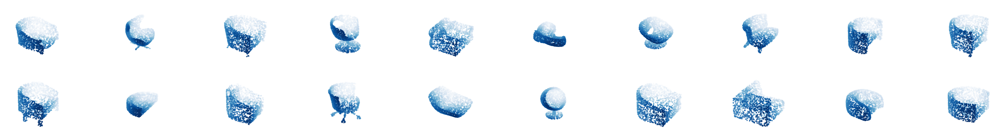

***********************************
1111
2242, 1314, 614, 4055, 6643, 4251, 5890, 3538, 4141, 1989, 5677, 5461, 5370, 3056, 5281, 4311, 6606, 5293, 5474, 4490, 


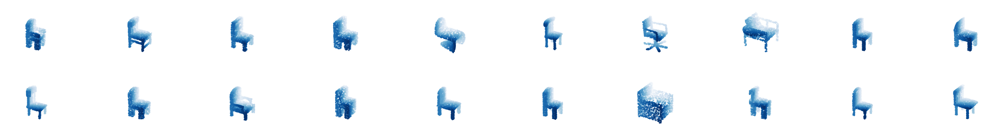

***********************************
Feature number= 1
2475
1584, 6753, 6489, 2513, 4848, 1303, 412, 4987, 1761, 337, 6715, 3230, 194, 3486, 127, 4806, 3198, 3061, 2627, 724, 


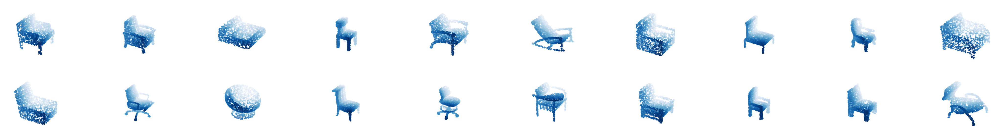

***********************************
437
1466, 99, 2892, 776, 5806, 3916, 2960, 5533, 3008, 1831, 49, 1596, 6277, 2182, 170, 444, 1604, 3239, 4804, 4083, 


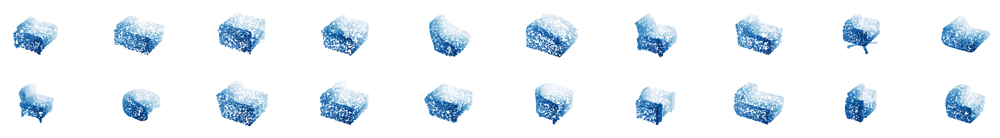

***********************************
165
2919, 453, 3518, 5162, 6402, 442, 2883, 933, 6677, 948, 2219, 3735, 3735, 1753, 142, 6198, 6390, 6013, 6758, 660, 


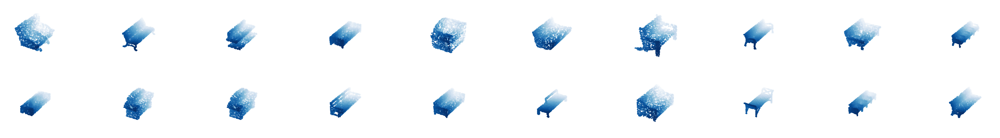

***********************************
3701
166, 4944, 2224, 6652, 6120, 4950, 4862, 1794, 5522, 793, 2725, 4192, 6026, 2847, 1269, 6257, 1855, 5036, 1742, 3091, 


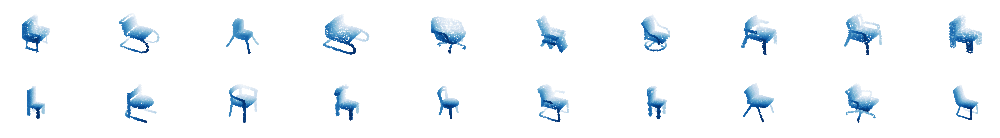

***********************************
Feature number= 2
5368
6373, 1339, 5913, 5284, 3157, 4199, 597, 5336, 402, 2748, 6666, 4664, 1014, 5251, 2364, 6693, 2194, 2918, 650, 3453, 


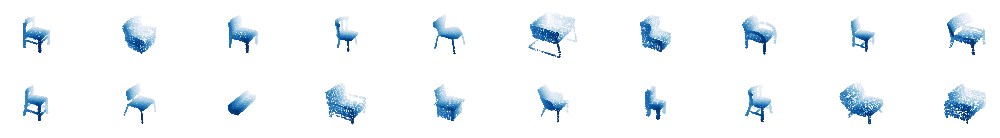

***********************************
159
4520, 5127, 4009, 6544, 3818, 1274, 2512, 1274, 5977, 737, 40, 3364, 1405, 1597, 3286, 2603, 555, 5122, 2741, 329, 


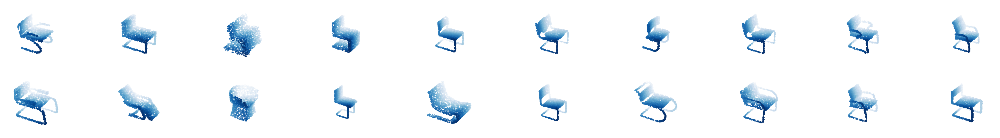

***********************************
785
4602, 3431, 1396, 6527, 4964, 2549, 3861, 3033, 3875, 3833, 233, 6594, 3894, 3836, 5854, 2634, 3612, 5718, 347, 3044, 


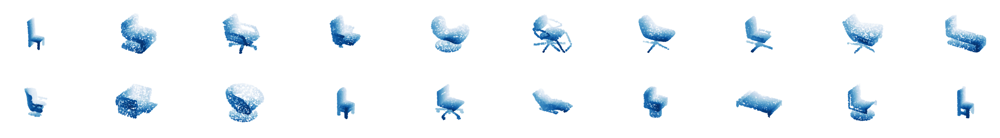

***********************************
43
5431, 2478, 105, 1252, 5900, 1972, 711, 4018, 105, 4926, 3763, 1739, 3217, 5691, 5431, 1494, 1494, 4926, 1494, 4939, 


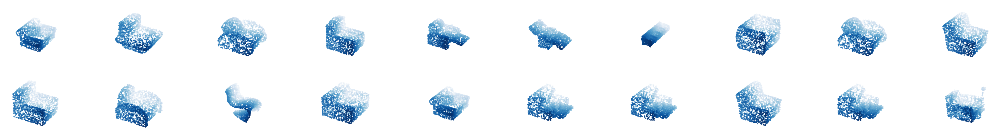

***********************************
131
4889, 4185, 2925, 5426, 3610, 3625, 3848, 5156, 4882, 1275, 738, 6767, 5930, 3314, 630, 1914, 4918, 5340, 2051, 237, 


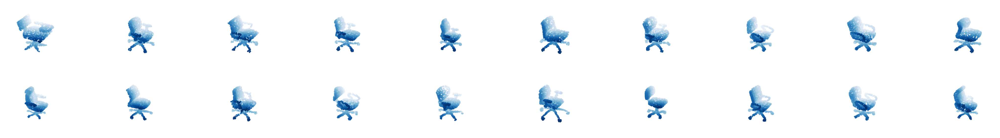

***********************************
292
3985, 2168, 2405, 2353, 4595, 4463, 4318, 6272, 1273, 5338, 2908, 5716, 5578, 2532, 3797, 4032, 736, 4067, 4595, 4595, 


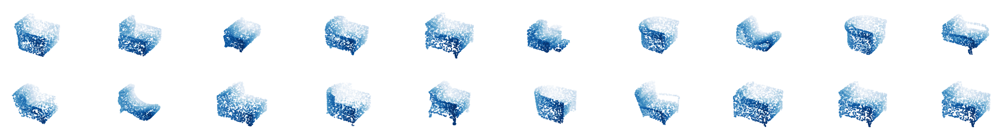

***********************************
Feature number= 3
305
1687, 3710, 6087, 1992, 4623, 3537, 5152, 6306, 158, 744, 419, 1775, 6114, 3715, 1464, 3565, 6465, 415, 4771, 1687, 


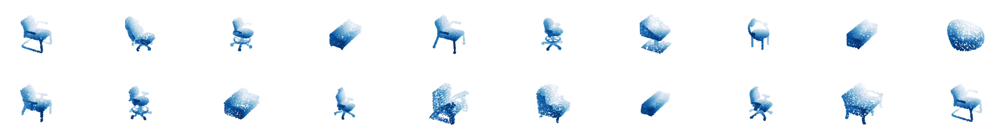

***********************************
1104
1125, 3508, 6226, 2807, 3847, 5089, 5026, 42, 3508, 4024, 3463, 923, 6196, 1561, 1521, 3498, 2495, 2188, 1444, 1426, 


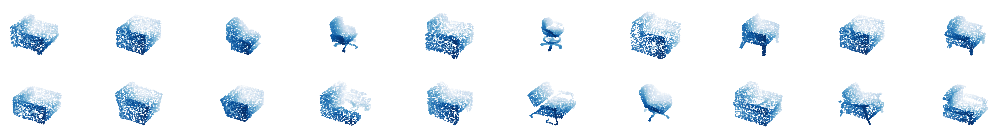

***********************************
69
4256, 185, 1039, 3126, 565, 3684, 2267, 3455, 1920, 2559, 6695, 5014, 1920, 5849, 5849, 2660, 5998, 1393, 1393, 3455, 


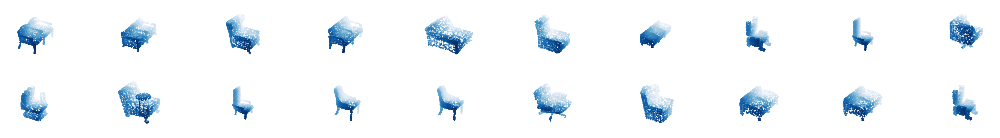

***********************************
34
2648, 1863, 2927, 2524, 6362, 5799, 6362, 2529, 5132, 4695, 1600, 6332, 273, 5760, 4695, 2062, 5799, 2529, 4487, 273, 


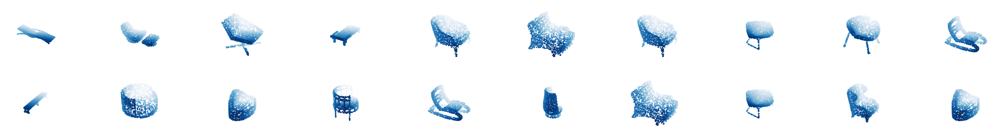

***********************************
3736
1374, 3777, 3177, 5405, 5396, 4673, 6610, 4158, 6038, 2276, 6641, 2459, 1695, 1279, 4957, 4473, 6740, 2611, 6227, 4941, 


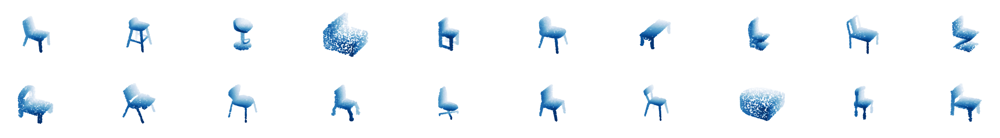

***********************************
1530
5274, 5024, 458, 4056, 1612, 4831, 1075, 5055, 6690, 6735, 47, 6665, 6301, 1445, 3700, 3600, 5994, 4232, 1636, 5564, 


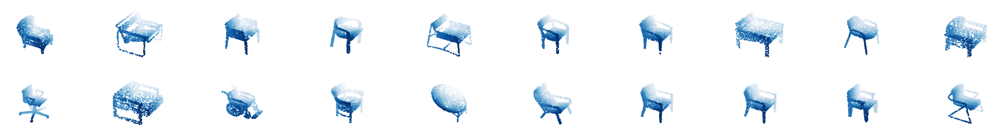

***********************************


In [11]:
#Visualize examples from these clusters # skip if necessary
n_clusterss=[4,4,6,6]
for k in range(4):
    n_clusters=n_clusterss[k]
    print('Feature number= '+str(k))
    labels= cluster_part_cont_ls4(k, n_clusters)
    for i in range(n_clusters):
        print(np.sum(labels==i))
        obs=[]
        count=0
        while True:
            j=np.random.randint(num_objs)
            if count==20:
                print('')
                break
            if labels[j]==i:
                count+=1
                obs.append(object_full[j].T)
                print(j, end=', ')
        plot_many_objects(2,10,obs)
        print('***********************************')


## 2. Select the Latent Directions;

specify the model and category you want to proceed with in the below cell

We have only provided the following trained models:

    chair class: AAE , Diffusion , Pointflow

    airplane class: AAE

    car class: AAE

In [12]:
model="Diffusion" #AAE / Pointflow / Diffusion
types="objects"

dictionary ={
    "category" : category,
    "type" : types,
}
  
json_object = json.dumps(dictionary, indent = 4)
  
with open("models/AAE/ckptselection.json", "w") as outfile:
    outfile.write(json_object)

if model=="AAE":
    from models.AAE.lspace_experiments_objs import *
    n_points=2048
elif model=="Pointflow":
    from models.Pointflow.lspace_experiments import *
    n_points=128
elif model=="Diffusion":
    from models.Diffusion.lspace_experiments import *
    n_points=1024
else:
    print("Invalid Model")

normalized_latent=[]

for i in object_full:
    code=encode(i)
    normalized_latent.append(code)
    
normalized_latent=np.squeeze(np.array(normalized_latent))
print(np.shape(normalized_latent))

model_load_successful
(6778, 1024)


In [13]:
##Filter the clusters by number of objects inside (100) and the change added to the center chair; 
# If it is the car class you will have to change the threshold to 0.003

def filter_gan_directions(coef,intercept):
    remove=True
    
    unit_coef = coef/ np.linalg.norm(coef)
    projection= np.zeros(n_points) - unit_coef*dist_hyperplane(coef, intercept, np.zeros(n_points))

    obj1=reconstruct_from_code(projection-0.5*unit_coef)
    obj2=reconstruct_from_code(projection+0.5*unit_coef)
    # plot_many_objects(1,2,[obj1,obj2])
    
    b= get_feature_dist(obj1.T, obj2.T)[0]
    a, _, _= part_change_score2(obj1, obj2)
    c= chamfer_dist(obj1,obj2)
    a=np.mean(a,1)
#     print(a)
#     print(b)
    return a,b,c

# n_clusterss= [5,4,6,7]
selected_coefs=[]
selected_intercepts=[]
for part_id in range(4):
    selected_coef=[]
    selected_int=[]    
    n_clusters=n_clusterss[part_id]
    labels= cluster_part_cont_ls4(part_id, n_clusters)
    coefs, intercepts= segment_recons_ls(n_clusters, labels)
    for j in range(n_clusters):
        if np.sum(labels==j)>100:
            a,b,c= filter_gan_directions(coefs[j],intercepts[j])
            print(a)
            print(b)
            val= np.sum(a)
            print(val)
            if val<0.01: #If car class change to 0.003
                print('remove')
            else:
                selected_coef.append(coefs[j])
                selected_int.append(intercepts[j])
    selected_coefs.append(selected_coef)
    selected_intercepts.append(selected_int)
            

Fitting SVMs
[0.06528987 0.0323569  1.6348519  0.06867623]
[0.01325034107921641, 0.015121846134690031, 0.34336946043279004, 10]
1.8011749
[0.03431756 0.02813503 0.12185398 0.0517289 ]
[0.009557843208312988, 0.012513875961303711, 0.01873612403869629, 0.028533995151519775]
0.23603547
[0.38542393 0.09328192 0.35795307 0.02079916]
[0.033954795260951354, 0.016077593562877635, 0.05123594074278637, 10]
0.8574581
[0.13744164 0.01467971 0.04729269 0.16741449]
[0.024093693999913346, 0.004837885011863108, 0.01568362441612048, 10]
0.36682853
Fitting SVMs
[0.0317529  0.08275503 0.05172674 0.23088501]
[0.005659997463226318, 0.008958101272583008, 0.019365906715393066, 0.04746288061141968]
0.3971197
[0.12513486 0.24618508 2.2342346  0.17103797]
[0.015900626008429453, 0.019448733058364587, 0.4639471775576429, 10]
2.7765925
[0.042066   0.08407233 0.18932718 1.5713714 ]
[0.01650327444076538, 0.019409656524658203, 0.04666393995285034, 0.39313507080078125]
1.886837
[0.05009716 0.11209369 0.07469247 0.22093

### 2. Edit Pointcloud

In [32]:
object_id=6
part_id=3
sel=1
alpha=0.5

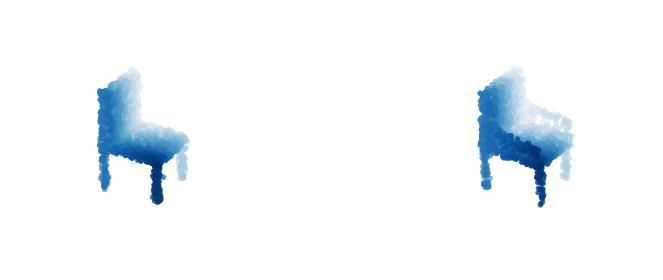

In [33]:
objs=[]
projection= encode(object_full[object_id])
A=reconstruct_from_code(projection)
objs.append(A)
unit_coef = selected_coefs[part_id][sel] / np.linalg.norm(selected_coefs[part_id][sel])
a= projection+alpha*unit_coef
A=reconstruct_from_code(a)
objs.append(A)
plot_many_objects(1,2,objs)

### Semantic localization score

In [16]:
def chamfer_dist(obj1, obj2):

    x=torch.from_numpy(np.asarray([obj1.T]))
    y=torch.from_numpy(np.asarray([obj2.T]))

    bs,num_points_x, points_dim = x.size()
    _,num_points_y, _ = y.size()

    #print(bs, num_points_x, points_dim)
    xx = torch.bmm(x, x.transpose(2, 1))
    yy = torch.bmm(y, y.transpose(2, 1))
    zz = torch.bmm(x, y.transpose(2, 1))
    diag_ind_x = torch.arange(0, num_points_x)
    diag_ind_y = torch.arange(0, num_points_y)

    if x.get_device() != -1:
        diag_ind_x = diag_ind_x.cuda(x.get_device())
        diag_ind_y = diag_ind_y.cuda(x.get_device())

    rx = xx[:, diag_ind_x, diag_ind_x].unsqueeze(1).expand_as(zz.transpose(2, 1))
    ry = yy[:, diag_ind_y, diag_ind_y].unsqueeze(1).expand_as(zz)
    P = (rx.transpose(2, 1) + ry - 2 * zz)

    mins1, _ = torch.min(P, 1)
    loss_1 = torch.sum(mins1)
    #loss_1 = torch.mean(mins1)
    mins2, _ = torch.min(P, 2)
    loss_2 = torch.sum(mins2)
    #loss_2 = torch.mean(mins2)
    #print(mins1.shape)
    
    #print(loss_1, loss_2)
    return [loss_1.cpu().numpy(), loss_2.cpu().numpy()]

def pc_center(pc):
    # centroid = np.mean(pc, axis=1)
    # pc = pc - centroid
    # m = np.max(np.sqrt(np.sum(pc ** 2, axis=1)))
    # pc = pc / m
    return pc

def part_change_score3(obj1,obj2, part_id):

    parts1= partsegpc(obj1.T)[0]
    parts2= partsegpc(obj2.T)[0]
    
    scores=[]
    
    #for i in range(4):
    token=False
    x=torch.from_numpy(pc_center(np.asarray([obj1.T[parts1==part_id]])))
    y=torch.from_numpy(pc_center(np.asarray([obj2.T[parts2==part_id]])))

    bs,num_points_x, points_dim = x.size()
    _,num_points_y, _ = y.size()
    #print(num_points_x, num_points_y)

    if num_points_x==0 and num_points_y==0:
        #print('here')
        scores.append([0, 0])
        #continue
    else:
        if num_points_x==0: 
            #print('a')
            x=torch.from_numpy(pc_center(np.asarray([obj1.T])))
            token=True
        if num_points_y==0:
            #print('b')
            y=torch.from_numpy(pc_center(np.asarray([obj2.T])))
            token=True

        bs,num_points_x, points_dim = x.size()
        _,num_points_y, _ = y.size()
        #print(num_points_x, num_points_y)
        xx = torch.bmm(x, x.transpose(2, 1))
        yy = torch.bmm(y, y.transpose(2, 1))
        zz = torch.bmm(x, y.transpose(2, 1))
        diag_ind_x = torch.arange(0, num_points_x)
        diag_ind_y = torch.arange(0, num_points_y)

        if x.get_device() != -1:
            diag_ind_x = diag_ind_x.cuda(x.get_device())
            diag_ind_y = diag_ind_y.cuda(x.get_device())

        rx = xx[:, diag_ind_x, diag_ind_x].unsqueeze(1).expand_as(zz.transpose(2, 1))
        ry = yy[:, diag_ind_y, diag_ind_y].unsqueeze(1).expand_as(zz)
        P = (rx.transpose(2, 1) + ry - 2 * zz)
        #print(P)
        mins1, _ = torch.min(P, 1)
        loss_1 = torch.sum(mins1)
        loss_1 = torch.mean(mins1)
        mins2, _ = torch.min(P, 2)
        loss_2 = torch.sum(mins2)
        loss_2 = torch.mean(mins2)

        if token:
            a,b= loss_1.cpu().numpy(), loss_2.cpu().numpy()
            scores.append([min(a,b),min(a,b)])
            #scores.append([loss_1.cpu().numpy(), loss_2.cpu().numpy()])
        else:
            scores.append([loss_1.cpu().numpy(), loss_2.cpu().numpy()])

    token=False
    x=torch.from_numpy(pc_center(np.asarray([obj1.T[parts1!=part_id]])))
    y=torch.from_numpy(pc_center(np.asarray([obj2.T[parts2!=part_id]])))

    bs,num_points_x, points_dim = x.size()
    _,num_points_y, _ = y.size()
    #print(num_points_x, num_points_y)

    if num_points_x==0 and num_points_y==0:
        #print('here')
        scores.append([0, 0])
        #continue
    else:
        if num_points_x==0: 
            #print('a')
            x=torch.from_numpy(pc_center(np.asarray([obj1.T])))
            token=True
        if num_points_y==0:
            #print('b')
            y=torch.from_numpy(pc_center(np.asarray([obj2.T])))
            token=True

        bs,num_points_x, points_dim = x.size()
        _,num_points_y, _ = y.size()
        #print(num_points_x, num_points_y)
        xx = torch.bmm(x, x.transpose(2, 1))
        yy = torch.bmm(y, y.transpose(2, 1))
        zz = torch.bmm(x, y.transpose(2, 1))
        diag_ind_x = torch.arange(0, num_points_x)
        diag_ind_y = torch.arange(0, num_points_y)

        if x.get_device() != -1:
            diag_ind_x = diag_ind_x.cuda(x.get_device())
            diag_ind_y = diag_ind_y.cuda(x.get_device())

        rx = xx[:, diag_ind_x, diag_ind_x].unsqueeze(1).expand_as(zz.transpose(2, 1))
        ry = yy[:, diag_ind_y, diag_ind_y].unsqueeze(1).expand_as(zz)
        P = (rx.transpose(2, 1) + ry - 2 * zz)
        #print(P)
        mins1, _ = torch.min(P, 1)
        loss_1 = torch.sum(mins1)
        loss_1 = torch.mean(mins1)
        mins2, _ = torch.min(P, 2)
        loss_2 = torch.sum(mins2)
        loss_2 = torch.mean(mins2)

        if token:
            a,b= loss_1.cpu().numpy(), loss_2.cpu().numpy()
            scores.append([min(a,b),min(a,b)])
            #scores.append([loss_1.cpu().numpy(), loss_2.cpu().numpy()])
        else:
            scores.append([loss_1.cpu().numpy(), loss_2.cpu().numpy()])
        
    
    
    return scores, parts1, parts2


##Filter the clusters by number of objects inside (100) and the change added to the center chair
def filter_gan_directions(coef,intercept,part_id):
    remove=True
    val=[]
    for i in range(100):
        unit_coef = coef/ np.linalg.norm(coef)
        noise= np.random.normal(0, 0.18, n_points)
        projection= noise - unit_coef*dist_hyperplane(coef, intercept, noise)

        obj1=reconstruct_from_code(projection-0*unit_coef)
        obj2=reconstruct_from_code(projection+1*unit_coef)

        a, _, _= part_change_score3(obj1, obj2,part_id)
        a=np.mean(a,1)
        val.append(a)
    return np.mean(val,0)

sem_local_score=[]
for part_id in range(4):
    for j in range(len(selected_coefs[part_id])):
        a= filter_gan_directions(selected_coefs[part_id][j],selected_intercepts[part_id][j],part_id)
        print('Localization score: part id ',part_id,', feature id ',j,' :',a[0]/a[1])
        sem_local_score.append([a[0]/a[1]])

Localization score: part id  0 , feature id  0  : 3.6612315
Localization score: part id  0 , feature id  1  : 3.4916031
Localization score: part id  0 , feature id  2  : 2.4813762
Localization score: part id  0 , feature id  3  : 4.66228
Localization score: part id  1 , feature id  0  : 0.45923498
Localization score: part id  1 , feature id  1  : 0.32955736
Localization score: part id  1 , feature id  2  : 0.393239
Localization score: part id  1 , feature id  3  : 0.33111137
Localization score: part id  2 , feature id  0  : 7.3383
Localization score: part id  2 , feature id  1  : 5.609282
Localization score: part id  2 , feature id  2  : 8.854253713832522
Localization score: part id  2 , feature id  3  : 9.356075332001902
Localization score: part id  2 , feature id  4  : 9.966008274539362
Localization score: part id  3 , feature id  0  : 8.094404361985848
Localization score: part id  3 , feature id  1  : 10.499283149540663
Localization score: part id  3 , feature id  2  : 8.68865396306

In [17]:
np.mean(sem_local_score)

5.438561065796031